# EDA for classifying player position

In [1]:
from IPython.core.display import display, HTML
display(HTML(
    '<style>'
        '#notebook { padding-top:0px !important; } ' 
        '.container { width:100% !important; } '
        '.end_space { min-height:0px !important; } '
    '</style>'
))

## Contents

* [Positional Rating Analysis](#Positional-Rating-Analysis)
* [Player Position Analysis](#Player-position)
* [Generalize player positions](#Generalize-player-positions)
* [Skills](#Skills)
* [Body Type](#body_type)
* [Work Rate](#work_rate)
* [Player Tags](#player_tags)
* [Player Traits](#player_traits)
* [Preferred Foot](#preferred_foot)
* [Club Analysis](#Club)

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm

import seaborn as sns
sns.set(style='whitegrid')

from sklearn.model_selection import cross_val_score
from sklearn.utils import resample
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import MultiLabelBinarizer, LabelEncoder, OrdinalEncoder

from collections import defaultdict
import math
import re

%matplotlib inline

#pd.set_option('display.width', 500)
#pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 110)

Original raw data downloaded from:

https://www.kaggle.com/stefanoleone992/fifa-20-complete-player-dataset


Glossary:

https://www.console-deals.com/blog/fifa-terminology-glossary-5504/

Player positions:
- CAM - Central attacking midfielder
- CB - Centre back
- CDM - Central defensive midfielder
- CF - Center forward
- CM - Centre midfielder
- GK - Goalkeeper
- LB - Left back
- LM - Left midfielder
- LW - Left winger (typically more attack-minded than a left midfielder)
- RB - Right back
- RM - Right midfielder
- RW - Right winger (a more attacking option than a right midfielder)
- ST - Striker


REAL OVERALL RATING - 
Seems to be a per-position adjustment based on the player's international reputation (IR). Some say that the number of stars can grant a +/-.
Possibly the OVR + IR

https://fifaforums.easports.com/en/discussion/82695/lack-of-team-management
Please read "Real Overall Rating" in sofifa
Different ability is needed in each position.
So Every position have different overall caculating.
This is already used in the game internally.
But Caculated overall is not displayed in Team Management.
Overall is always same in every positon.
This must be improved.

At each field layer left, right, and central positions are highly corelated.


### Constants

In [3]:
TEST_SET_CLUBS = [
    'FC Barcelona', 'FC Bayern München', 'Real Madrid', 'Paris Saint-Germain', 'Juventus', 
    'Atlético Madrid', 'Manchester City', 'Liverpool', 'Manchester United' ]

# From the problem statement, the following variables cannot be used
NOT_TO_BE_USED_COLS = ["sofifa_id", "player_url", "short_name", "long_name", "real_face", "wage_eur" ]

# Additional list of variables not needed
UNNEEDED_FEATURE_COLS = ["dob", "nationality", "value_eur", "nation_jersey_number", "loaned_from", "release_clause_eur", 
                         "team_jersey_number", "joined", "contract_valid_until", "nation_position", "international_reputation"]


SKILL_ATTACKING_COLS = [ 'attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys' ]
SKILL_SKILL_COLS = [ 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control' ]
SKILL_MOVEMENT_COLS = [ 'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 'movement_reactions', 'movement_balance']
SKILL_POWER_COLS = [ 'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots']
SKILL_MENTALITY_COLS = [ 'mentality_aggression', 'mentality_interceptions', 'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure']
SKILL_DEFENDING_COLS = [ 'defending_marking', 'defending_standing_tackle', 'defending_sliding_tackle']
SKILL_GOALKEEPING_COLS = [ 'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes']

SKILL_GK_COLS = ["gk_diving", "gk_handling", "gk_kicking", "gk_reflexes", "gk_speed", "gk_positioning"]

SKILL_COLS = SKILL_ATTACKING_COLS + SKILL_SKILL_COLS + SKILL_MOVEMENT_COLS + SKILL_POWER_COLS + SKILL_MENTALITY_COLS + SKILL_DEFENDING_COLS + SKILL_GOALKEEPING_COLS

SKILL_AGG_COLS = ["pace", "shooting", "passing", "dribbling", "defending", "physic"]

skill_agg = {
    "pace": [ 'movement_acceleration', 'movement_sprint_speed' ],
    "shooting": [ 'mentality_positioning', 'attacking_finishing', 'power_shot_power', 'power_long_shots', 'attacking_volleys', 'mentality_penalties'],
    "defending": ['mentality_interceptions', 'attacking_heading_accuracy', 'defending_marking', 'defending_standing_tackle', 'defending_sliding_tackle']
}


RESPONSE_COL = ["team_position"]

REAL_OVERALL_RATING_COLS = [ 
    'ls', 'st', 'rs',                     # strikers
    'lw', 'lf', 'cf', 'rf','rw',          # forwards
    'lam', 'cam', 'ram',                  # attacking midfielders
    'lm', 'lcm', 'cm', 'rcm', 'rm',       # midfielders
    'lwb', 'ldm','cdm','rdm','rwb',       # wingers
    'lb','lcb','cb','rcb','rb',           # backs
]

# TODO there is no single gk predictor  
# 'gk'                                  # goal keeper


In [4]:
DATA_DIR_CLEANED = 'cleaned_data/'
DATA_DIR_RAW = 'data/'


###  Examine the raw data

In [5]:
df_raw = pd.read_csv(DATA_DIR_RAW+'players_19.csv')
print(f"Total samples in data file: {len(df_raw)}")

df_raw.head(3)

Total samples in data file: 17770


,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,33,1985-02-05,187,83,Portugal,Juventus,94,94,77000000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,127100000.0,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7.0,NaN,2018-07-10,2022.0,LS,7.0,90.0,93.0,81.0,89.0,35.0,79.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Diver, Flair, Long Shot Taker...",84,94,89,81,87,88,81,76,77,94,89,91,87,96,70,95,95,88,79,93,63,29,95,82,85,95,28,31,23,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
1,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,31,1987-06-24,170,72,Argentina,FC Barcelona,94,94,110500000,565000,"CF, RW, ST",Left,5,4,4,Medium/Medium,Messi,Yes,226500000.0,"#Dribbler, #Distance Shooter, #FK Specialist, ...",RW,10.0,NaN,2004-07-01,2021.0,CF,10.0,88.0,91.0,88.0,96.0,32.0,61.0,NaN,NaN,NaN,NaN,NaN,NaN,"Finesse Shot, Long Shot Taker (CPU AI Only), S...",77,95,70,90,86,97,93,94,87,96,91,86,91,95,95,85,68,72,59,94,48,22,94,94,75,96,33,28,26,6,11,15,14,8,88+2,88+2,88+2,92+2,93+2,93+2,93+2,92+2,93+2,93+2,93+2,90+2,84+2,84+2,84+2,90+2,63+2,61+2,61+2,61+2,63+2,58+2,47+2,47+2,47+2,58+2
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,26,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,93,118500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,228100000.0,"#Speedster, #Dribbler, #FK Specialist, #Acroba...",CAM,10.0,NaN,2017-08-03,2022.0,LW,10.0,92.0,84.0,83.0,95.0,32.0,59.0,NaN,NaN,NaN,NaN,NaN,NaN,"Diver, Selfish, Flair, Speed Dribbler (CPU AI ...",79,87,62,84,84,96,88,87,78,95,94,90,96,94,84,80,61,81,49,82,56,36,89,87,81,94,27,24,33,9,9,15,15,11,84+3,84+3,84+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,88+3,81+3,81+3,81+3,88+3,65+3,60+3,60+3,60+3,65+3,60+3,47+3,47+3,47+3,60+3


In [6]:
for i, c in enumerate(df_raw.columns):
    print(f"{i:4d}\t{c}")

   0	sofifa_id
   1	player_url
   2	short_name
   3	long_name
   4	age
   5	dob
   6	height_cm
   7	weight_kg
   8	nationality
   9	club
  10	overall
  11	potential
  12	value_eur
  13	wage_eur
  14	player_positions
  15	preferred_foot
  16	international_reputation
  17	weak_foot
  18	skill_moves
  19	work_rate
  20	body_type
  21	real_face
  22	release_clause_eur
  23	player_tags
  24	team_position
  25	team_jersey_number
  26	loaned_from
  27	joined
  28	contract_valid_until
  29	nation_position
  30	nation_jersey_number
  31	pace
  32	shooting
  33	passing
  34	dribbling
  35	defending
  36	physic
  37	gk_diving
  38	gk_handling
  39	gk_kicking
  40	gk_reflexes
  41	gk_speed
  42	gk_positioning
  43	player_traits
  44	attacking_crossing
  45	attacking_finishing
  46	attacking_heading_accuracy
  47	attacking_short_passing
  48	attacking_volleys
  49	skill_dribbling
  50	skill_curve
  51	skill_fk_accuracy
  52	skill_long_passing
  53	skill_ball_control
  54	movement_acceleration
  55	

#### Inspect the data types

In [7]:

df_raw.dtypes

sofifa_id      int64
player_url    object
short_name    object
long_name     object
age            int64
               ...  
lb            object
lcb           object
cb            object
rcb           object
rb            object
Length: 104, dtype: object

#### Inspect some individual records

In [8]:
# Take a look at a single player
df_raw[ df_raw['sofifa_id'] == 224458]

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
721,224458,https://sofifa.com/player/224458/diogo-jose-te...,Diogo Jota,Diogo José Teixeira da Silva,21,1996-12-04,178,73,Portugal,Wolverhampton Wanderers,78,86,15500000,56000,"LW, ST",Right,2,4,4,High/High,Lean,No,32600000.0,#Acrobat,LW,18.0,NaN,2018-07-01,2021.0,NaN,NaN,82.0,74.0,69.0,82.0,51.0,76.0,NaN,NaN,NaN,NaN,NaN,NaN,"Injury Free, Speed Dribbler (CPU AI Only)",65,74,56-2,73,71,81,76,58,65,83,89+2,76,87,80,87,78,66-1,82,72+3,71,80,54,82,72,61,83,49,54,39,7,12,15,9,11,75+2,75+2,75+2,77+2,78+2,78+2,78+2,77+2,77+2,77+2,77+2,77+2,73+2,73+2,73+2,77+2,66+2,65+2,65+2,65+2,66+2,63+2,59+2,59+2,59+2,63+2


In [9]:
# This one has skills > 100
df_raw[ df_raw['sofifa_id'] == 219414]

cols = ['defending'] + skill_agg['defending']
df_raw[ df_raw['sofifa_id'] == 219414][cols]

,defending,mentality_interceptions,attacking_heading_accuracy,defending_marking,defending_standing_tackle,defending_sliding_tackle
13192,57.0,55,49,59,59,60


In [10]:
# This one has negative skill values
df_raw[ df_raw['sofifa_id'] == 240215]

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
8610,240215,https://sofifa.com/player/240215/christian-cap...,C. Capone,Christian Capone,19,1999-04-28,183,75,Italy,Pescara,66,82,1400000,4000,LW,Right,1,3,3,Medium/Medium,Lean,No,NaN,NaN,LW,11.0,Atalanta,NaN,2019.0,NaN,NaN,70.0,59.0,60.0,73.0,20.0,51.0,NaN,NaN,NaN,NaN,NaN,NaN,"Flair, Technical Dribbler (CPU AI Only)",60,60,38,63,49,74,64,48,48,72,68,71,75,61,69,61,47,79,45,56,33,18,58,67,61,62,22-33,14,17,14,8,13,9,11,59+2,59+2,59+2,66+2,64+2,64+2,64+2,66+2,65+2,65+2,65+2,65+2,59+2,59+2,59+2,65+2,48+2,42+2,42+2,42+2,48+2,43+2,32+2,32+2,32+2,43+2


In [11]:
cols = ['defending'] + skill_agg['defending']
df_raw[ df_raw['sofifa_id'] == 240215][cols]

,defending,mentality_interceptions,attacking_heading_accuracy,defending_marking,defending_standing_tackle,defending_sliding_tackle
8610,20.0,18,38,22-33,14,17


### Common Utility Functions

In [12]:
# Split a string containing comma separated values and produces a list
def split_ignore_nan(p) -> list:   
    if p is None or p == np.nan:
        return []
    elif ( isinstance(p, float)) and math.isnan(p):
        return []
    else:
        return [ q.strip() for q in p.split(',') if len(q) >0]
    
    
# Return the number of comma separated values    
def split_count(p) -> int:   
    if p is None or p == np.nan:
        return 0
    elif ( isinstance(p, float)) and math.isnan(p):
        return 0
    else:
        items = [ q.strip() for q in p.split(',') if len(q) >0] 
        return len(items)   

In [13]:
# Executes a cell with a mathematical statement. If NaN is found
# zero is returned. This functino is applied on the rating columns where
# the value can be of the form OVR + IR or NaN
def eval_rating(r) -> int:
    if r is None or r == np.nan:
        return 0
    elif ( isinstance(r, float)) and math.isnan(r):
        return 0
    else:
        return eval(r)

## Player Position Analysis <a class="anchor" id="Player-position"></a>
[▲ Return to contents](#Contents)

There are three columns with player position related information. 
- nation_position 
 - Possibly reflective of most playes not making their national team in that year. 
 - Has a significant number of NaN (16666 out of 17770)
 - Due to it's sparsity, ignoring this field.
- team_position 
 - Seems to reflect for a specific club a players starting position. 
 - Clubs can have a mean of 33 player, 
 - there are 29 unique position that can appear in team_position. 
 - Fourteen of these are stronly related and just a slight variable. 
 - Almost 60% of the team postition are substitue or reserved
- player_positions 
 - Has 15 unique position which is a subset of those in team_position. 
 - A player can have multilpe entries that vary
 - the entries in player_positions can be similar to that in team_position.
 - all samples contain a value, not NaN found


In [14]:
position_cols = ['player_positions', 'team_position', 'nation_position']
df_raw[position_cols]

,player_positions,team_position,nation_position
0,"ST, LW",LW,LS
1,"CF, RW, ST",RW,CF
2,"LW, CAM",CAM,LW
3,GK,GK,GK
4,"CAM, CM",RCM,RCM
...,...,...,...
17765,"CM, CDM",SUB,NaN
17766,ST,RES,NaN
17767,CM,LCM,NaN
17768,RB,SUB,NaN


In [15]:

for c in position_cols:
    print(f"{c} NaN samples:\n{df_raw[[c]].isna().sum()}\n")


player_positions NaN samples:
player_positions    0
dtype: int64

team_position NaN samples:
team_position    223
dtype: int64

nation_position NaN samples:
nation_position    16666
dtype: int64



In [16]:
df_raw[ df_raw['team_position'].isna()][position_cols]

,player_positions,team_position,nation_position
422,"CM, CDM",NaN,SUB
492,CB,NaN,LCB
611,GK,NaN,SUB
675,RB,NaN,SUB
879,"ST, CF",NaN,RS
...,...,...,...
16385,GK,NaN,SUB
16475,"LB, LM",NaN,SUB
16538,CDM,NaN,LDM
16755,GK,NaN,SUB


Number of player positions that have more then 1 entry. From the dataframe below, the higher ratings directly drives the player and team position. Multiple entries in player_position is not reflective of a tie or even ordered.

In [17]:
position_and_rating_col = position_cols + REAL_OVERALL_RATING_COLS
df_raw [ df_raw['player_positions'].apply(split_count) > 1][position_and_rating_col]

,player_positions,team_position,nation_position,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,"ST, LW",LW,LS,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
1,"CF, RW, ST",RW,CF,88+2,88+2,88+2,92+2,93+2,93+2,93+2,92+2,93+2,93+2,93+2,90+2,84+2,84+2,84+2,90+2,63+2,61+2,61+2,61+2,63+2,58+2,47+2,47+2,47+2,58+2
2,"LW, CAM",CAM,LW,84+3,84+3,84+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,88+3,81+3,81+3,81+3,88+3,65+3,60+3,60+3,60+3,65+3,60+3,47+3,47+3,47+3,60+3
4,"CAM, CM",RCM,RCM,82+3,82+3,82+3,87+3,87+3,87+3,87+3,87+3,88+3,88+3,88+3,88+3,87+3,87+3,87+3,88+3,77+3,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3
7,"CM, CDM",RCM,NaN,77+3,77+3,77+3,85+3,84+3,84+3,84+3,85+3,87+3,87+3,87+3,86+3,88+3,88+3,88+3,86+3,82+3,81+3,81+3,81+3,82+3,79+3,71+3,71+3,71+3,79+3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17752,"CM, RB",SUB,NaN,42+2,42+2,42+2,44+2,44+2,44+2,44+2,44+2,45+2,45+2,45+2,44+2,45+2,45+2,45+2,44+2,44+2,45+2,45+2,45+2,44+2,45+2,45+2,45+2,45+2,45+2
17753,"RB, LB",SUB,NaN,34+2,34+2,34+2,31+2,31+2,31+2,31+2,31+2,29+2,29+2,29+2,33+2,32+2,32+2,32+2,33+2,43+2,41+2,41+2,41+2,43+2,45+2,48+2,48+2,48+2,45+2
17754,"RB, CDM",SUB,NaN,40+2,40+2,40+2,43+2,42+2,42+2,42+2,43+2,44+2,44+2,44+2,44+2,45+2,45+2,45+2,44+2,45+2,48+2,48+2,48+2,45+2,46+2,47+2,47+2,47+2,46+2
17763,"CM, CDM",SUB,NaN,44+2,44+2,44+2,44+2,45+2,45+2,45+2,44+2,45+2,45+2,45+2,46+2,46+2,46+2,46+2,46+2,46+2,45+2,45+2,45+2,46+2,46+2,43+2,43+2,43+2,46+2


In [18]:
position_and_rating_col = position_cols + REAL_OVERALL_RATING_COLS
df_raw [ df_raw['player_positions'].apply(split_count) > 1][position_and_rating_col]

,player_positions,team_position,nation_position,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,"ST, LW",LW,LS,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
1,"CF, RW, ST",RW,CF,88+2,88+2,88+2,92+2,93+2,93+2,93+2,92+2,93+2,93+2,93+2,90+2,84+2,84+2,84+2,90+2,63+2,61+2,61+2,61+2,63+2,58+2,47+2,47+2,47+2,58+2
2,"LW, CAM",CAM,LW,84+3,84+3,84+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,88+3,81+3,81+3,81+3,88+3,65+3,60+3,60+3,60+3,65+3,60+3,47+3,47+3,47+3,60+3
4,"CAM, CM",RCM,RCM,82+3,82+3,82+3,87+3,87+3,87+3,87+3,87+3,88+3,88+3,88+3,88+3,87+3,87+3,87+3,88+3,77+3,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3
7,"CM, CDM",RCM,NaN,77+3,77+3,77+3,85+3,84+3,84+3,84+3,85+3,87+3,87+3,87+3,86+3,88+3,88+3,88+3,86+3,82+3,81+3,81+3,81+3,82+3,79+3,71+3,71+3,71+3,79+3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17752,"CM, RB",SUB,NaN,42+2,42+2,42+2,44+2,44+2,44+2,44+2,44+2,45+2,45+2,45+2,44+2,45+2,45+2,45+2,44+2,44+2,45+2,45+2,45+2,44+2,45+2,45+2,45+2,45+2,45+2
17753,"RB, LB",SUB,NaN,34+2,34+2,34+2,31+2,31+2,31+2,31+2,31+2,29+2,29+2,29+2,33+2,32+2,32+2,32+2,33+2,43+2,41+2,41+2,41+2,43+2,45+2,48+2,48+2,48+2,45+2
17754,"RB, CDM",SUB,NaN,40+2,40+2,40+2,43+2,42+2,42+2,42+2,43+2,44+2,44+2,44+2,44+2,45+2,45+2,45+2,44+2,45+2,48+2,48+2,48+2,45+2,46+2,47+2,47+2,47+2,46+2
17763,"CM, CDM",SUB,NaN,44+2,44+2,44+2,44+2,45+2,45+2,45+2,44+2,45+2,45+2,45+2,46+2,46+2,46+2,46+2,46+2,46+2,45+2,45+2,45+2,46+2,46+2,43+2,43+2,43+2,46+2


Number of player positions that are different from the team_position. Biggest gap will be in the representation of RES and SUB.

Remove samples that do not have a team position

In [19]:
df_raw = df_raw.dropna(subset=['team_position', 'player_positions'])
df_raw.shape

(17547, 104)

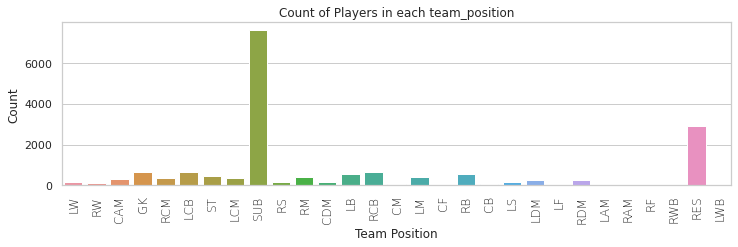

In [20]:
plt.figure(figsize=(12,3))
cplot= sns.countplot(x='team_position', data=df_raw)
cplot.set_xlabel('Team Position')
cplot.set_ylabel('Count')
cplot.set_title('Count of Players in each team_position')

cplot.set_xticklabels(cplot.get_xticklabels(),
                      rotation=90,
                      horizontalalignment='center',
                      fontweight='light',
                      fontsize='large');
plt.show()



In [21]:
team_position_counts = df_raw[['team_position']].value_counts().to_frame('all_count')
team_position_counts['all_pct'] = team_position_counts['all_count'] / len(df_raw) * 100


In [22]:
print(f"SUB and RES team positions take {team_position_counts.loc['SUB', 'all_pct'][0] + team_position_counts.loc['RES', 'all_pct'][0]:0.2f}%") 

df_raw[ (df_raw['team_position'] != 'SUB') & (df_raw['team_position'] != 'RES') ].shape


SUB and RES team positions take 59.96%


(7026, 104)

Almost 60% of the team postition are subsitue or reserved, Let's see if player_positions can be mapped to a common

In [23]:
df_raw[ (df_raw['team_position'] == 'SUB')][['player_positions', 'team_position']]

,player_positions,team_position
17,"CAM, CM, LW",SUB
30,"CAM, CM, RM",SUB
32,GK,SUB
50,"CF, ST",SUB
55,GK,SUB
...,...,...
17763,"CM, CDM",SUB
17764,CM,SUB
17765,"CM, CDM",SUB
17768,RB,SUB


Find all the unique positions in the **player_positions** column and compare to the unique positions in the **team_position** column.

In [24]:
unique_player_positions = set()
for items in df_raw['player_positions'].iteritems():
    for item in split_ignore_nan(items[1]):
        unique_player_positions.add(item.strip())
        
        
print(f"Number of unique player positions: ", len(unique_player_positions))
print(unique_player_positions)

unique_team_positions = df_raw['team_position'].unique()
unique_team_positions = set(unique_team_positions)
        
print(f"Number of unique team positions: ", len(unique_team_positions))
print(unique_team_positions)

Number of unique player positions:  15
{'CDM', 'CB', 'RWB', 'RB', 'GK', 'LWB', 'CM', 'LB', 'LM', 'RW', 'CAM', 'ST', 'LW', 'RM', 'CF'}
Number of unique team positions:  29
{'LAM', 'RES', 'GK', 'LM', 'RW', 'RDM', 'RAM', 'RWB', 'LDM', 'RB', 'CF', 'SUB', 'RCB', 'LB', 'RCM', 'CM', 'LCM', 'RS', 'LW', 'CDM', 'LCB', 'LS', 'LWB', 'LF', 'CAM', 'RF', 'ST', 'RM', 'CB'}


In [25]:
print("Those position in team_position and not in player_positions: \n", unique_team_positions - unique_player_positions)

Those position in team_position and not in player_positions: 
 {'LAM', 'SUB', 'RES', 'RCB', 'LDM', 'LCB', 'LS', 'LF', 'RCM', 'LCM', 'RAM', 'RDM', 'RF', 'RS'}


In [26]:
print("Those position in player_positions and not in team_position: \n",unique_player_positions - unique_team_positions)

Those position in player_positions and not in team_position: 
 set()


Split player_positions taking the first as the 'Best Position'



In [27]:
#df_raw['player_positions'].apply(split_ignore_nan)
#foo = lambda x: pd.Series([i for i in reversed(x.split(','))])
first_entry = lambda x: pd.Series([x.split(',')[0]])

best_position = df_raw['player_positions'].apply(first_entry)
best_position.rename(columns={0:'player_best_position'},inplace=True)

df_raw['player_best_position'] = best_position

##  Positional Rating Analysis <a class="anchor" id="Positional-Rating-Analysis"></a>

[▲ Return to contents](#Contents)

See how the variables related to each other. From the summary stats, to the correlation and pairwise plot we see strong correlation between each position and its peer or mirror oposite. For example Left winger (lw) are identical to Right winger (rw) ratings. Left Forward (lf), Center Forward (cf), and Right Forward (rf) are also equal. Etc...

Most dominate team positions are SUB and RES.


In [28]:
# Evaluate rating columns and update them from string to an int
for col in REAL_OVERALL_RATING_COLS:
    df_raw[col]= df_raw[col].apply( eval_rating)


In [29]:
df_raw[REAL_OVERALL_RATING_COLS].dtypes

ls     int64
st     int64
rs     int64
lw     int64
lf     int64
cf     int64
rf     int64
rw     int64
lam    int64
cam    int64
ram    int64
lm     int64
lcm    int64
cm     int64
rcm    int64
rm     int64
lwb    int64
ldm    int64
cdm    int64
rdm    int64
rwb    int64
lb     int64
lcb    int64
cb     int64
rcb    int64
rb     int64
dtype: object

In [30]:
df_raw[REAL_OVERALL_RATING_COLS].describe()

,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
count,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000
mean,53.115176,53.115176,53.115176,54.183564,53.901408,53.901408,53.901408,54.183564,54.136092,54.136092,54.136092,54.787998,53.441899,53.441899,53.441899,54.787998,52.792101,52.183108,52.183108,52.183108,52.792101,52.163675,51.118254,51.118254,51.118254,52.163675
std,20.716520,20.716520,20.716520,21.360859,21.256109,21.256109,21.256109,21.360859,21.303200,21.303200,21.303200,21.302457,20.702164,20.702164,20.702164,21.302457,20.545906,20.812211,20.812211,20.812211,20.545906,20.565598,21.226919,21.226919,21.226919,20.565598
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,50.000000,50.000000,50.000000,51.000000,50.000000,50.000000,50.000000,51.000000,51.000000,51.000000,51.000000,52.000000,51.000000,51.000000,51.000000,52.000000,50.000000,48.000000,48.000000,48.000000,50.000000,48.000000,44.000000,44.000000,44.000000,48.000000
50%,59.000000,59.000000,59.000000,61.000000,60.000000,60.000000,60.000000,61.000000,60.000000,60.000000,60.000000,61.000000,59.000000,59.000000,59.000000,61.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,57.000000,57.000000,57.000000,58.000000
75%,66.000000,66.000000,66.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,65.000000,65.000000,65.000000,67.000000,65.000000,65.000000,65.000000,65.000000,65.000000,65.000000,66.000000,66.000000,66.000000,65.000000
max,94.000000,94.000000,94.000000,94.000000,95.000000,95.000000,95.000000,94.000000,95.000000,95.000000,95.000000,92.000000,91.000000,91.000000,91.000000,92.000000,89.000000,90.000000,90.000000,90.000000,89.000000,88.000000,90.000000,90.000000,90.000000,88.000000


In [31]:
df_raw[REAL_OVERALL_RATING_COLS].corr()

,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
ls,1.000000,1.000000,1.000000,0.986799,0.993957,0.993957,0.993957,0.986799,0.986893,0.986893,0.986893,0.982886,0.962697,0.962697,0.962697,0.982886,0.869587,0.836718,0.836718,0.836718,0.869587,0.835170,0.753074,0.753074,0.753074,0.835170
st,1.000000,1.000000,1.000000,0.986799,0.993957,0.993957,0.993957,0.986799,0.986893,0.986893,0.986893,0.982886,0.962697,0.962697,0.962697,0.982886,0.869587,0.836718,0.836718,0.836718,0.869587,0.835170,0.753074,0.753074,0.753074,0.835170
rs,1.000000,1.000000,1.000000,0.986799,0.993957,0.993957,0.993957,0.986799,0.986893,0.986893,0.986893,0.982886,0.962697,0.962697,0.962697,0.982886,0.869587,0.836718,0.836718,0.836718,0.869587,0.835170,0.753074,0.753074,0.753074,0.835170
lw,0.986799,0.986799,0.986799,1.000000,0.997425,0.997425,0.997425,1.000000,0.996927,0.996927,0.996927,0.997487,0.971651,0.971651,0.971651,0.997487,0.882747,0.839446,0.839446,0.839446,0.882747,0.843846,0.741622,0.741622,0.741622,0.843846
lf,0.993957,0.993957,0.993957,0.997425,1.000000,1.000000,1.000000,0.997425,0.997437,0.997437,0.997437,0.994077,0.972001,0.972001,0.972001,0.994077,0.875151,0.837532,0.837532,0.837532,0.875151,0.836987,0.741560,0.741560,0.741560,0.836987
cf,0.993957,0.993957,0.993957,0.997425,1.000000,1.000000,1.000000,0.997425,0.997437,0.997437,0.997437,0.994077,0.972001,0.972001,0.972001,0.994077,0.875151,0.837532,0.837532,0.837532,0.875151,0.836987,0.741560,0.741560,0.741560,0.836987
rf,0.993957,0.993957,0.993957,0.997425,1.000000,1.000000,1.000000,0.997425,0.997437,0.997437,0.997437,0.994077,0.972001,0.972001,0.972001,0.994077,0.875151,0.837532,0.837532,0.837532,0.875151,0.836987,0.741560,0.741560,0.741560,0.836987
rw,0.986799,0.986799,0.986799,1.000000,0.997425,0.997425,0.997425,1.000000,0.996927,0.996927,0.996927,0.997487,0.971651,0.971651,0.971651,0.997487,0.882747,0.839446,0.839446,0.839446,0.882747,0.843846,0.741622,0.741622,0.741622,0.843846
lam,0.986893,0.986893,0.986893,0.996927,0.997437,0.997437,0.997437,0.996927,1.000000,1.000000,1.000000,0.996654,0.982360,0.982360,0.982360,0.996654,0.891267,0.857213,0.857213,0.857213,0.891267,0.854188,0.759717,0.759717,0.759717,0.854188
cam,0.986893,0.986893,0.986893,0.996927,0.997437,0.997437,0.997437,0.996927,1.000000,1.000000,1.000000,0.996654,0.982360,0.982360,0.982360,0.996654,0.891267,0.857213,0.857213,0.857213,0.891267,0.854188,0.759717,0.759717,0.759717,0.854188


Mapping of correlated columns skills column to Player Positions
<pre>
-    'ls', 'st', 'rs',     ==> ST      # Striker
-    'lf', 'cf', 'rf',     ==> CF      # Center forward
-    'lw',                 ==> LW      # Left winger (typically more attack-minded than a left midfielder)
-    'rw',                 ==> RW      # Right winger (a more attacking option than a right midfielder)
-    'lam', 'cam', 'ram',  ==> CAM     # Central attacking midfielder
-    'lm'                  ==> LM      # Left midfielder
-    'lcm', 'cm', 'rcm',   ==> CM      # Centre midfielder
-    'rm',                 ==> RM      # Right midfielder
-    'lwb'                 ==> LWB     #
-    'ldm','cdm','rdm',    ==> CDM     # Central defensive midfielder
-    'rwb',                ==> RWB     # 
-    'lb'                  ==> LB      # Left back
-    'lcb','cb','rcb',     ==> CB      # Centre back
-    'rb',                 ==> RB      # Right back
-                          ==> GK      # Goalkeeper
</pre>



In [32]:
position_rating_map = {
    'rating_striker': 'st',
    'rating_wing_left': 'lw',
    'rating_forward_center': 'cf',
    'rating_wing_right': 'rw',
    'rating_attacking_midfielder_center': 'cam',
    'rating_midfielder_left': 'lm',
    'rating_midfielder_center': 'cm',
    'rating_midfielder_right': 'rm',
    'rating_back_wing_left': 'lwb',
    'rating_central_def_midfielder': 'cdm',
    'rating_back_wing_right': 'rwb',
    'rating_back_left': 'lb',
    'rating_back_center': 'cb',
    'rating_back_right': 'rb'
}

for k, r in position_rating_map.items():
    print(f"{r:5} mapped to {k}")
    df_raw[k] = df_raw[r]


st    mapped to rating_striker
lw    mapped to rating_wing_left
cf    mapped to rating_forward_center
rw    mapped to rating_wing_right
cam   mapped to rating_attacking_midfielder_center
lm    mapped to rating_midfielder_left
cm    mapped to rating_midfielder_center
rm    mapped to rating_midfielder_right
lwb   mapped to rating_back_wing_left
cdm   mapped to rating_central_def_midfielder
rwb   mapped to rating_back_wing_right
lb    mapped to rating_back_left
cb    mapped to rating_back_center
rb    mapped to rating_back_right


In [33]:
position_ratings = [ r for r in position_rating_map.keys()] 
df_raw[position_ratings + ['team_position']]

,rating_striker,rating_wing_left,rating_forward_center,rating_wing_right,rating_attacking_midfielder_center,rating_midfielder_left,rating_midfielder_center,rating_midfielder_right,rating_back_wing_left,rating_central_def_midfielder,rating_back_wing_right,rating_back_left,rating_back_center,rating_back_right,team_position
0,94,92,93,92,91,91,84,91,68,64,68,64,56,64,LW
1,90,94,95,94,95,92,86,92,65,63,65,60,49,60,RW
2,87,92,92,92,92,91,84,91,68,63,68,63,50,63,CAM
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,GK
4,85,90,90,90,91,91,90,91,80,80,80,76,69,76,RCM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17765,42,44,44,44,46,45,48,45,48,50,48,48,50,48,SUB
17766,47,50,48,50,48,49,42,49,40,36,40,38,34,38,RES
17767,47,50,49,50,50,51,48,51,51,48,51,51,48,51,LCM
17768,48,49,48,49,47,48,43,48,48,43,48,47,46,47,SUB


/home/saad/anaconda3/envs/cs109a/lib/python3.8/site-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/home/saad/anaconda3/envs/cs109a/lib/python3.8/site-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/home/saad/anaconda3/envs/cs109a/lib/python3.8/site-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/home/saad/anaconda3/envs/cs109a/lib/python3.8/site-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/home/saad/anaconda3/envs/cs109a/lib/python3.8/site-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


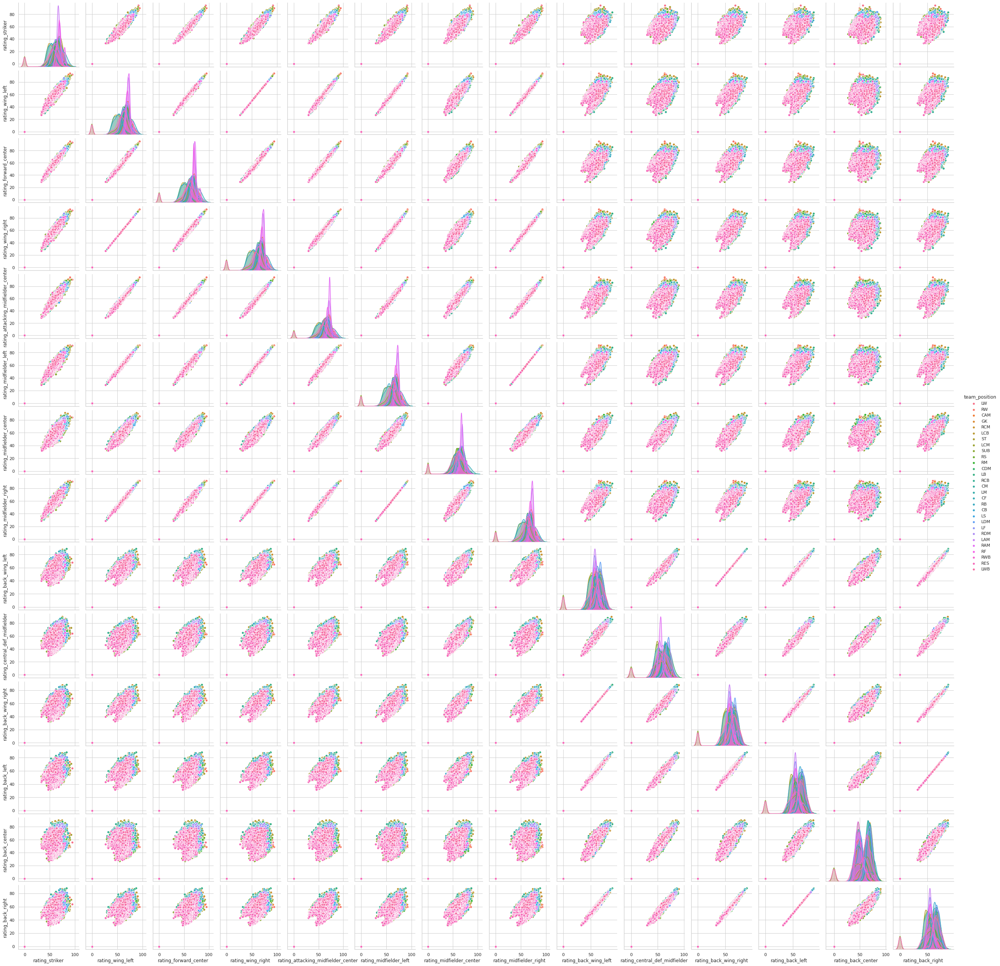

In [34]:
position_cols = [ r for r in position_rating_map.keys()] + ['team_position']
sns.pairplot(df_raw[position_cols], hue='team_position');

### Generalize player positions <a class="anchor" id="Generalize-player-positions"></a>
[▲ Return to contents](#Contents)


In [35]:
# Update the team position to match the reduced positions in the player position column        

def generalize_position(p) -> str:   

    position_mapping = {}
    position_mapping.update({ pos:'ST' for pos in [ 'LS', 'ST', 'RS']})
    position_mapping.update({ 'LW':'LW'})
    position_mapping.update({ 'RW':'RW'})
    position_mapping.update({ pos:'CF' for pos in [ 'LF', 'CF', 'RF']})
    position_mapping.update({ pos:'CAM' for pos in [ 'LAM', 'CAM', 'RAM']})
    position_mapping.update({ pos:'CM' for pos in [  'LCM', 'CM', 'RCM']})
    position_mapping.update({ 'LM':'LM'})
    position_mapping.update({ 'RM':'RM'})    
    position_mapping.update({ pos:'CDM' for pos in [ 'LDM', 'CDM', 'RDM']})
    position_mapping.update({ 'LWB':'LWB'})
    position_mapping.update({ 'RWB':'RWB'}) 
    position_mapping.update({ pos:'CB' for pos in [ 'LCB', 'CB', 'RCB']})
    position_mapping.update({ 'LB':'LB'})
    position_mapping.update({ 'RB':'RB'}) 
    position_mapping.update({ 'GK':'GK'})
    position_mapping.update({ 'SUB':'SUB'})
    position_mapping.update({ 'RES':'RES'})

    if p == np.nan:
        return 'RES'
    elif ( isinstance(p, float)) and math.isnan(p):
        return 'RES'
    else:
        return position_mapping[p]
    


In [36]:
df_raw['team_position_general'] = df_raw['team_position'].apply( generalize_position)

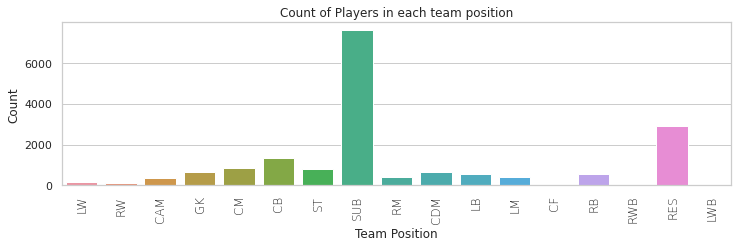

In [37]:
plt.figure(figsize=(12,3))
cplot= sns.countplot(x='team_position_general', data=df_raw)
cplot.set_xlabel('Team Position')
cplot.set_ylabel('Count')
cplot.set_title('Count of Players in each team position')

cplot.set_xticklabels(cplot.get_xticklabels(),
                      rotation=90,
                      horizontalalignment='center',
                      fontweight='light',
                      fontsize='large');
plt.show()


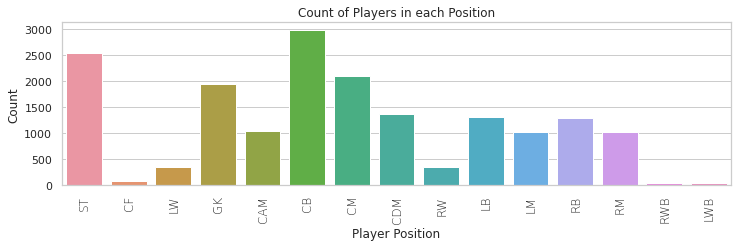

In [38]:
plt.figure(figsize=(12,3))
cplot= sns.countplot(x='player_best_position', data=df_raw)
cplot.set_xlabel('Player Position')
cplot.set_ylabel('Count')
cplot.set_title('Count of Players in each Position')

cplot.set_xticklabels(cplot.get_xticklabels(),
                      rotation=90,
                      horizontalalignment='center',
                      fontweight='light',
                      fontsize='large');
plt.show()

/home/saad/anaconda3/envs/cs109a/lib/python3.8/site-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/home/saad/anaconda3/envs/cs109a/lib/python3.8/site-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/home/saad/anaconda3/envs/cs109a/lib/python3.8/site-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/home/saad/anaconda3/envs/cs109a/lib/python3.8/site-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/home/saad/anaconda3/envs/cs109a/lib/python3.8/site-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


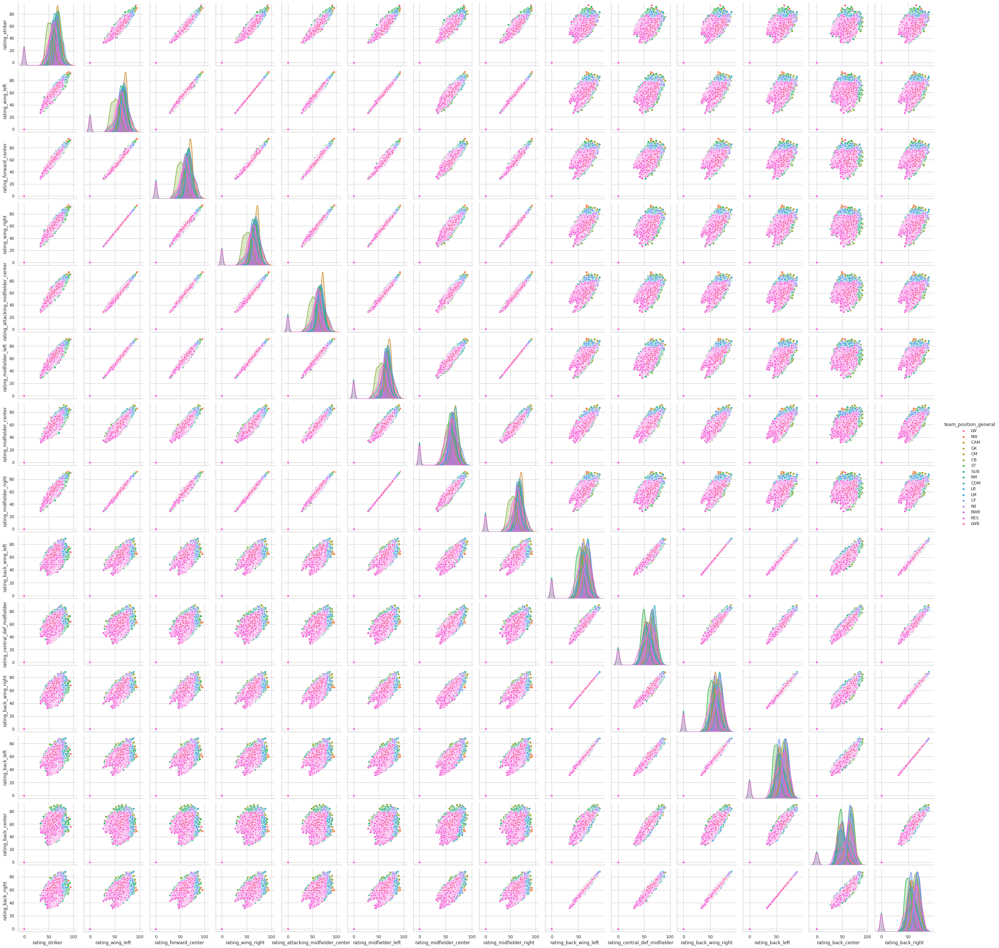

In [39]:
position_cols = [ r for r in position_rating_map.keys()] + ['team_position_general']
sns.pairplot(df_raw[position_cols], hue='team_position_general');

In [40]:
le = LabelEncoder()

df_raw['team_position'] = le.fit_transform(df_raw['team_position'])

team_position_encoding = le.classes_
team_position_encoding

array(['CAM', 'CB', 'CDM', 'CF', 'CM', 'GK', 'LAM', 'LB', 'LCB', 'LCM',
       'LDM', 'LF', 'LM', 'LS', 'LW', 'LWB', 'RAM', 'RB', 'RCB', 'RCM',
       'RDM', 'RES', 'RF', 'RM', 'RS', 'RW', 'RWB', 'ST', 'SUB'],
      dtype=object)

### Skills <a class="anchor" id="Skills"></a>
[▲ Return to contents](#Contents)


The columns pace, shooting, dribbling, defending and physic seem to be an aggregated summary of a collection of individual skills. The website shows a *layout 3* that reveals the association. As seen below with pace, shooting, defending, the mean of the aggregated columns is linearly related. Since the mapping of these summary skills to position it not know, the individuals skills will be used. No information loss is expected due to the strong correlation.

gk_ columns have a significant number of NaN, goalkeeping columns look better.


In [41]:
df_raw[SKILL_COLS].describe()

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547,17547
unique,360,372,329,378,253,387,303,258,380,391,461,439,402,336,290,326,342,496,396,350,346,357,381,361,234,337,434,373,352,142,141,137,147,142
top,62,58,58,64,49,64,45,42,58,65,68,67,68,65,68,68,70,68,67,58,65,62,58,58,45,60,60,66,64,8,10,12,10,11
freq,492,434,578,777,378,665,375,461,577,749,683,661,551,790,581,541,648,598,595,473,481,455,533,566,475,671,529,548,527,1556,1584,1564,1581,1543


In [42]:
# Evaluate skill columns and update them from string to an int
for col in SKILL_COLS:
    df_raw[col]= df_raw[col].apply( eval_rating)


In [43]:
# This one has negative skill values
df_raw[ df_raw['sofifa_id'] == 240215][SKILL_COLS]

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
8610,60,60,38,63,49,74,64,48,48,72,68,71,75,61,69,61,47,79,45,56,33,18,58,67,61,62,-11,14,17,14,8,13,9,11


In [44]:

count = 0 
for c in SKILL_COLS:
    count += len(df_raw[ df_raw[c] < 0])

print(" values < 0 = ", count)

count = 0 
for c in SKILL_COLS:
    count += len(df_raw[ df_raw[c] > 100])

print(" values > 100 = ", count)

 values < 0 =  4
 values > 100 =  9


In [45]:
for col in skill_agg:
    display(df_raw[ [col] + skill_agg[col]].head(5))

,pace,movement_acceleration,movement_sprint_speed
0,90.0,89,91
1,88.0,91,86
2,92.0,94,90
3,NaN,57,58
4,77.0,78,76


,shooting,mentality_positioning,attacking_finishing,power_shot_power,power_long_shots,attacking_volleys,mentality_penalties
0,93.0,95,94,95,93,87,85
1,91.0,94,95,85,94,86,75
2,84.0,89,87,80,82,84,81
3,NaN,12,13,31,12,13,40
4,86.0,87,83,91,91,82,79


,defending,mentality_interceptions,attacking_heading_accuracy,defending_marking,defending_standing_tackle,defending_sliding_tackle
0,35.0,29,89,28,31,23
1,32.0,22,70,33,28,26
2,32.0,36,62,27,24,33
3,NaN,30,21,15,21,13
4,60.0,60,55,67,58,51


In [46]:
# This one has negative skill values
cols = ['defending'] + skill_agg['defending']
df_raw[ df_raw['sofifa_id'] == 240215][cols]


,defending,mentality_interceptions,attacking_heading_accuracy,defending_marking,defending_standing_tackle,defending_sliding_tackle
8610,20.0,18,38,-11,14,17


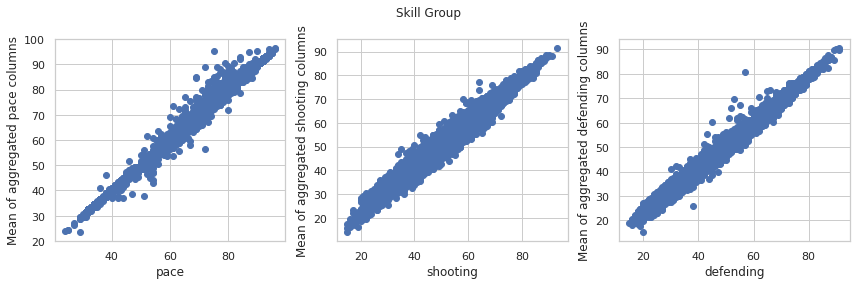

In [47]:

fig, axs = plt.subplots( nrows=1, ncols=3, figsize=(12,4))
ax = axs.ravel()

for i, col in enumerate(skill_agg):
    df_raw[f'{col}_mean'] = df_raw[skill_agg[col]].mean(axis=1)
    ax[i].scatter( df_raw[col], df_raw[f'{col}_mean'])
    ax[i].set_xlabel(col)
    ax[i].set_ylabel(f"Mean of aggregated {col} columns")

fig.suptitle("Skill Group")
plt.tight_layout()
plt.show()

In [48]:
df_raw[SKILL_GOALKEEPING_COLS].head() 

,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
0,7,11,15,14,11
1,6,11,15,14,8
2,9,9,15,15,11
3,90,85,87,88,94
4,15,13,5,10,13


In [49]:
df_raw[SKILL_GK_COLS].head()

,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning
0,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN
3,90.0,85.0,87.0,94.0,58.0,88.0
4,NaN,NaN,NaN,NaN,NaN,NaN


In [50]:
print(f"NaN SKILL_GOALKEEPING_COLS samples:\n{df_raw[SKILL_GOALKEEPING_COLS].isna().sum()}")
print(f"NaN SKILL_GK_COLS samples:\n{df_raw[SKILL_GK_COLS].isna().sum()}")


NaN SKILL_GOALKEEPING_COLS samples:
goalkeeping_diving         0
goalkeeping_handling       0
goalkeeping_kicking        0
goalkeeping_positioning    0
goalkeeping_reflexes       0
dtype: int64
NaN SKILL_GK_COLS samples:
gk_diving         15593
gk_handling       15593
gk_kicking        15593
gk_reflexes       15593
gk_speed          15593
gk_positioning    15593
dtype: int64


Plot skills against player_best_position

In [51]:
player_best_position = 'player_best_position'

print("Before removing RES, SUB: :", df_raw.shape)
df_skills = df_raw[SKILL_COLS + [player_best_position]].copy()
df_skills = df_skills[ df_skills[player_best_position] != 'RES']
df_skills = df_skills[ df_skills[player_best_position] != 'SUB']
print("After removing RES, SUB: :", df_skills.shape)

Before removing RES, SUB: : (17547, 123)
After removing RES, SUB: : (17547, 35)


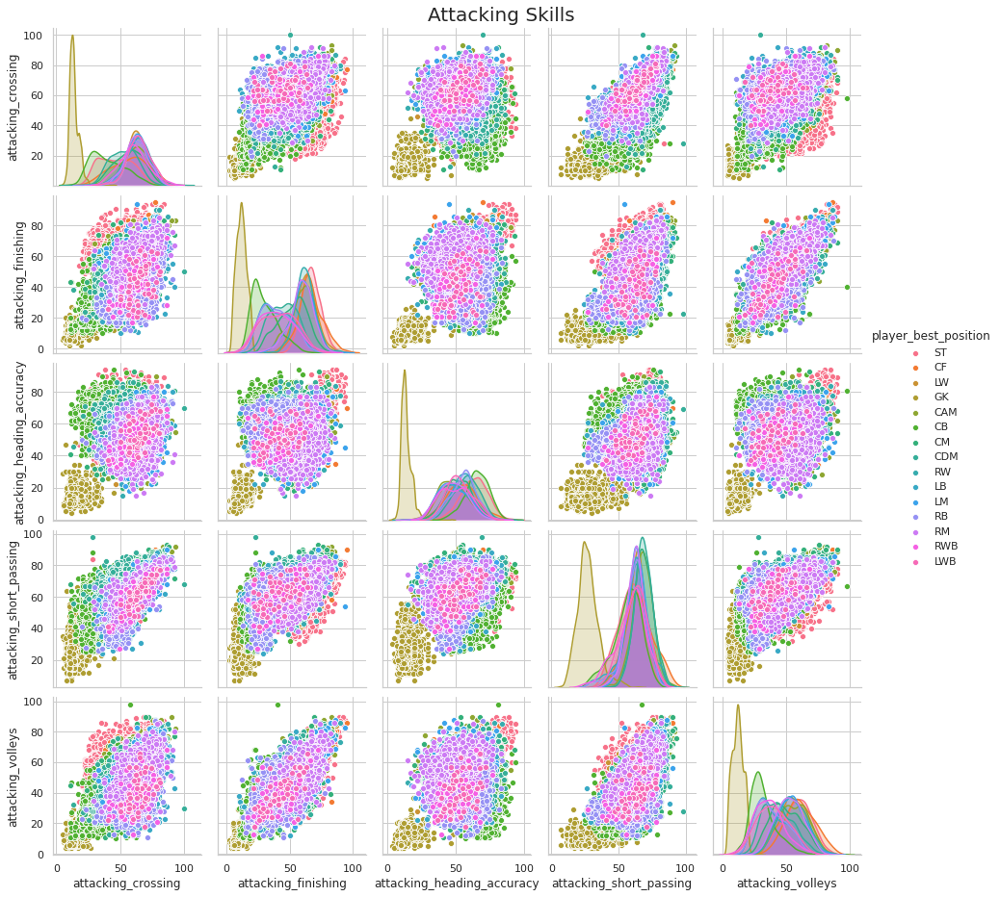

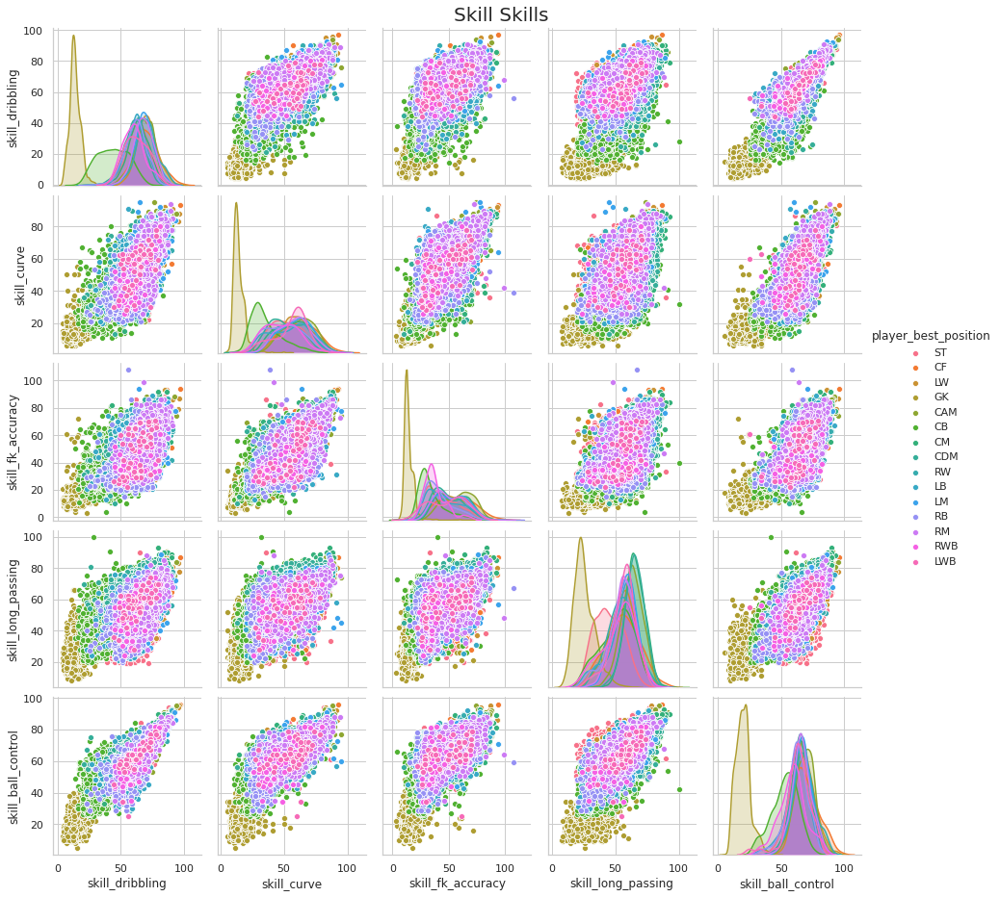

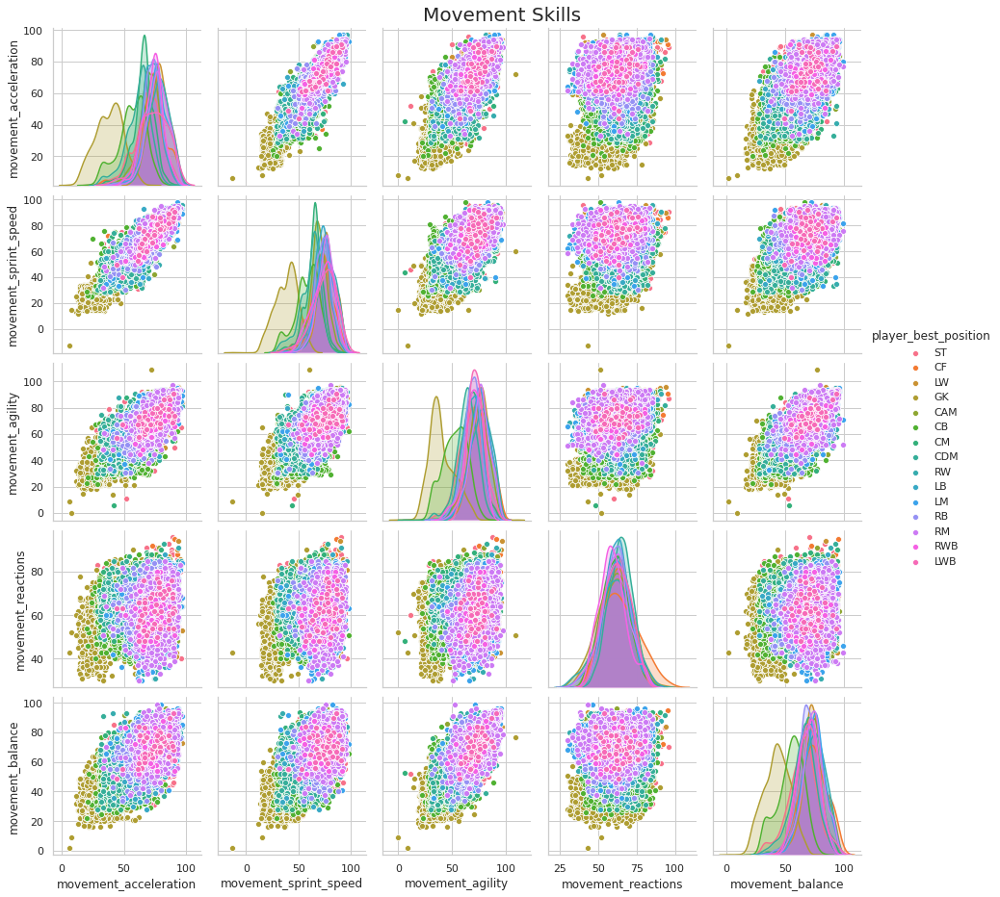

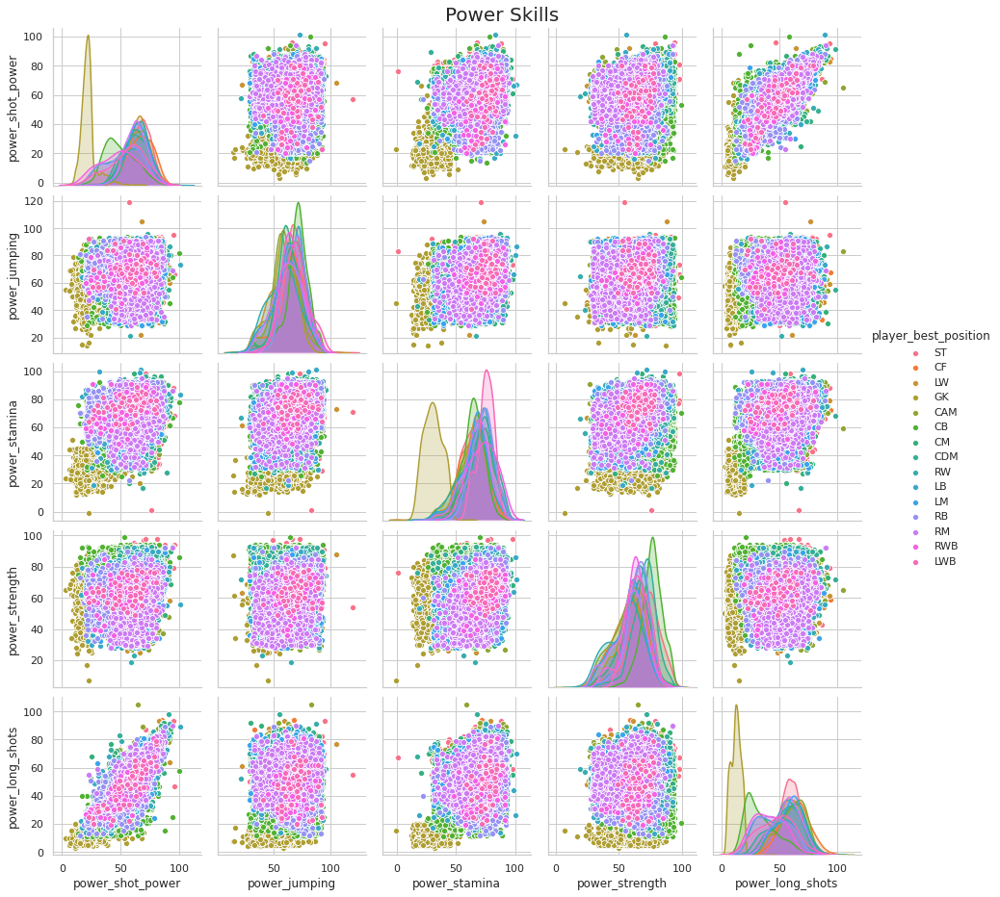

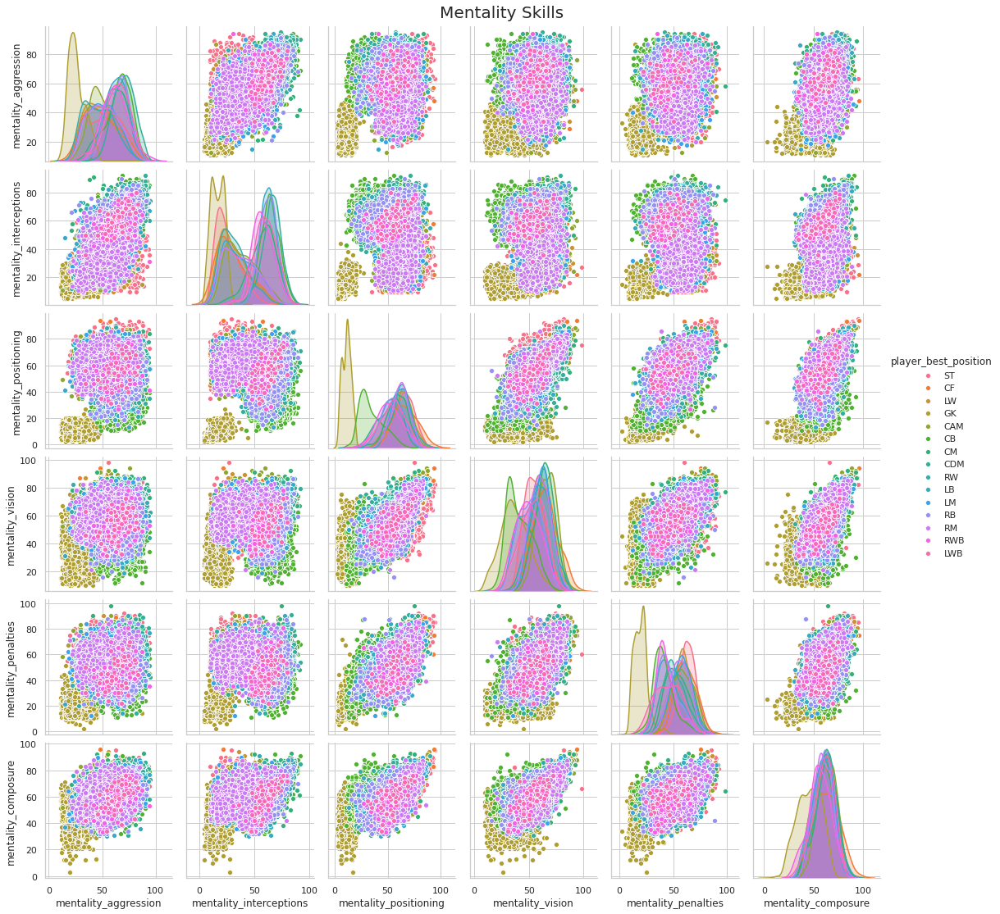

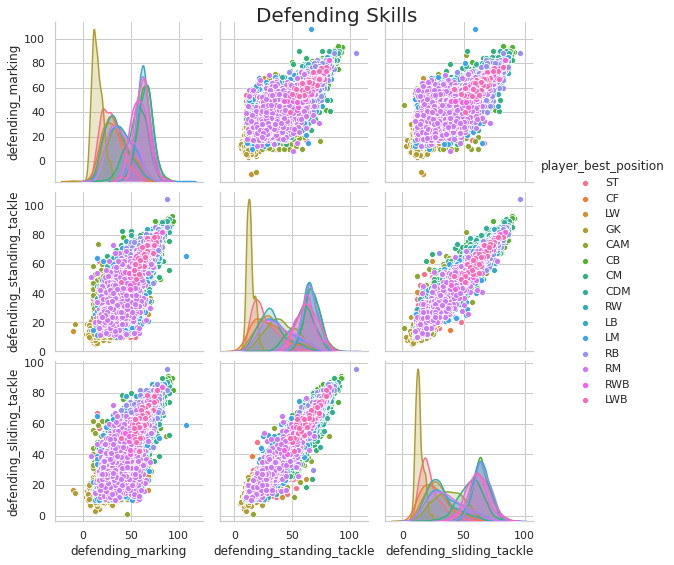

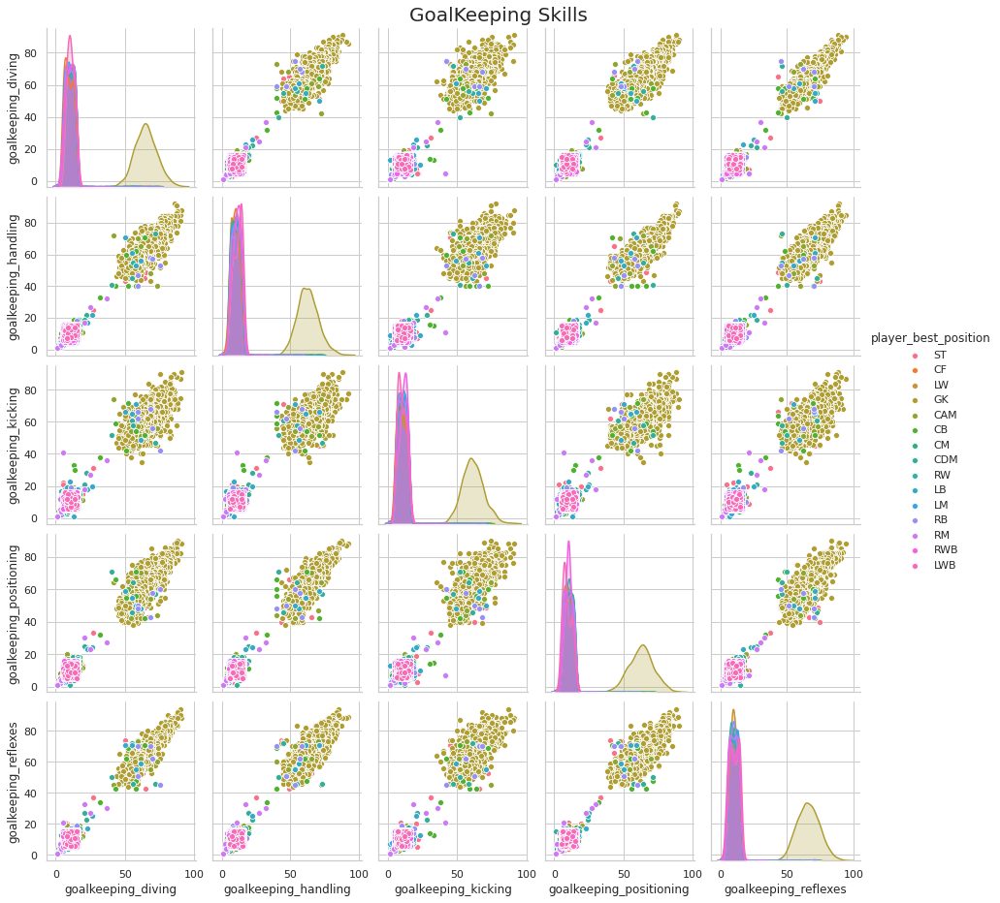

In [52]:
group_names = [ "Attacking Skills", "Skill Skills", "Movement Skills", "Power Skills", "Mentality Skills", "Defending Skills", "GoalKeeping Skills"]
group_cols = [ SKILL_ATTACKING_COLS, SKILL_SKILL_COLS, SKILL_MOVEMENT_COLS, SKILL_POWER_COLS, SKILL_MENTALITY_COLS, SKILL_DEFENDING_COLS, SKILL_GOALKEEPING_COLS]
for title, cols in zip(group_names, group_cols):
    pp = sns.pairplot(df_skills[cols + [player_best_position]], hue=player_best_position);
    pp.fig.suptitle(title, fontsize=20, y=1.02);


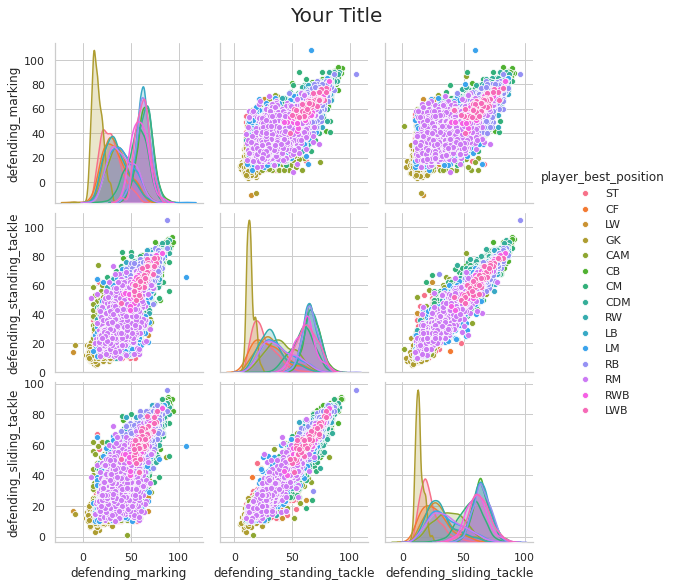

In [53]:
pp = sns.pairplot(df_skills[SKILL_DEFENDING_COLS + [player_best_position]], hue=player_best_position);
pp.fig.suptitle("Your Title", fontsize=20, y=1.06);


### Body Type  <a class="anchor" id="body_type"></a>
[▲ Return to contents](#Contents)

There are essentially 3 basic body types, Lean, Normal, Stocky and six custom body types for specific players. It is not clear if this was purposeful or in error. To clean these custom types they will be replaced with the dominate majority - Normal.

In [54]:
df_raw['body_type'].isna().sum()

0

In [55]:
df_raw['body_type'].value_counts()

Normal                 10260
Lean                    6215
Stocky                  1065
Courtois                   1
Shaqiri                    1
PLAYER_BODY_TYPE_25        1
C. Ronaldo                 1
Akinfenwa                  1
Neymar                     1
Messi                      1
Name: body_type, dtype: int64

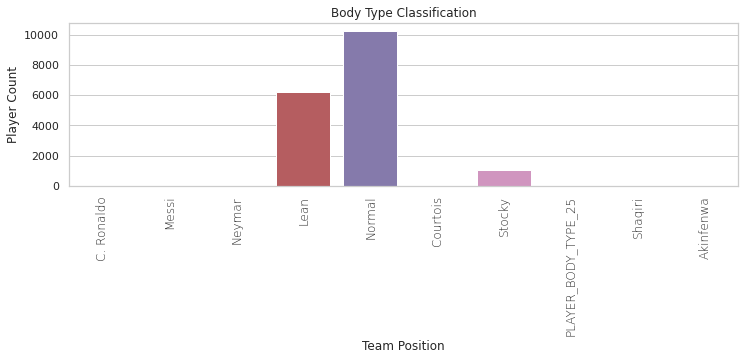

In [56]:
plt.figure(figsize=(12,3))
cplot= sns.countplot(x='body_type', data=df_raw)
cplot.set_xlabel('Team Position')
cplot.set_ylabel('Player Count')
cplot.set_title('Body Type Classification')

cplot.set_xticklabels(cplot.get_xticklabels(),
                      rotation=90,
                      horizontalalignment='center',
                      fontweight='light',
                      fontsize='large');
plt.show()

In [57]:
# df_raw[ ~df_raw['body_type'].isin(['Normal', 'Lean', 'Stocky']) ][['short_name', 'body_type']]

In [58]:
# Convert those few specialized body types to the commone three.
df_raw[ ~df_raw['body_type'].isin(['Normal', 'Lean', 'Stocky']) ] = 'Normal'

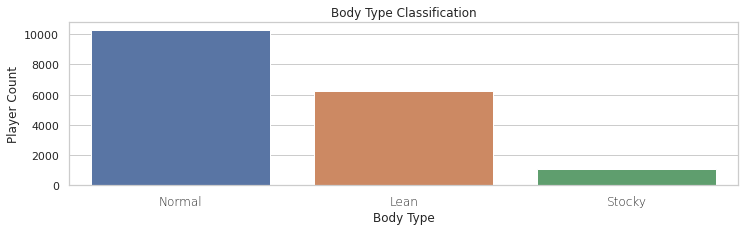

In [59]:
plt.figure(figsize=(12,3))
cplot= sns.countplot(x='body_type', data=df_raw)
cplot.set_xlabel('Body Type')
cplot.set_ylabel('Player Count')
cplot.set_title('Body Type Classification')

cplot.set_xticklabels(cplot.get_xticklabels(),
                      rotation=0,
                      horizontalalignment='center',
                      fontweight='light',
                      fontsize='large');
plt.show()

### work_rate <a class="anchor" id="work_rate"></a>
[▲ Return to contents](#Contents)

Categorical consisting of 10 possible values. They will be encoded as an ordinal.

In [60]:
df_raw['work_rate'].isna().sum()

0

In [61]:
df_raw['work_rate'].value_counts()

Medium/Medium    9503
High/Medium      3107
Medium/High      1600
High/High         970
Medium/Low        805
High/Low          672
Low/Medium        433
Low/High          420
Low/Low            30
Normal              7
Name: work_rate, dtype: int64

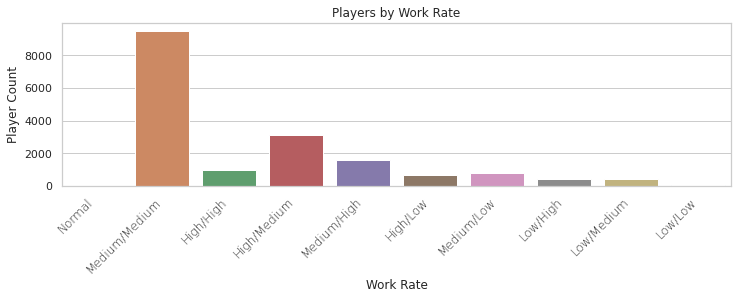

In [62]:
plt.figure(figsize=(12,3))
cplot= sns.countplot(x='work_rate', data=df_raw)
cplot.set_xlabel('Work Rate')
cplot.set_ylabel('Player Count')
cplot.set_title('Players by Work Rate')

cplot.set_xticklabels(cplot.get_xticklabels(),
                      rotation=45,
                      horizontalalignment='right',
                      fontweight='light',
                      fontsize='large');
plt.show()

In [63]:
# Order the work rating from low to high and then encode as an ordinal

work_rate_cat = [
    "Low/Low",
    "Low/Medium",
    "Low/High",
    "Medium/Low",
    "Medium/Medium",
    "Normal",
    "Medium/High",     
    "High/Low",
    "High/Medium",      
    "High/High"        
]

enc = OrdinalEncoder(categories={ 0: work_rate_cat})


df_raw['work_rate_ordinal'] = enc.fit_transform(df_raw[['work_rate']] )

In [64]:
df_raw[['work_rate', 'work_rate_ordinal']].head(10)

,work_rate,work_rate_ordinal
0,Normal,5.0
1,Normal,5.0
2,Normal,5.0
3,Medium/Medium,4.0
4,High/High,9.0
5,High/Medium,8.0
6,High/Medium,8.0
7,High/High,9.0
8,High/Medium,8.0
9,Medium/Medium,4.0


### player_traits <a class="anchor" id="player_traits"></a>
[▲ Return to contents](#Contents)

In [65]:
df_raw['player_traits'].head(10)

0                                               Normal
1                                               Normal
2                                               Normal
3                       GK Long Throw, Saves with Feet
4    Leadership, Early Crosser, Long Passer (CPU AI...
5    Dives Into Tackles (CPU AI Only), Leadership, ...
6    Diver, Beat Offside Trap, Outside Foot Shot, T...
7    Leadership, Long Shot Taker (CPU AI Only), Pla...
8    Beat Offside Trap, Finesse Shot, Flair, Playma...
9            Puncher, GK Long Throw, Comes For Crosses
Name: player_traits, dtype: object

In [66]:
df_raw['player_traits'].isna().sum()

9619

In [67]:
player_traits = defaultdict(int)
for items in df_raw['player_traits'].iteritems():
    for item in split_ignore_nan(items[1]):
        player_traits[item.strip()] += 1
        
        
print(f"Number of unique player traits: ", len(player_traits))
player_traits

Number of unique player traits:  37


defaultdict(int,
            {'Normal': 7,
             'GK Long Throw': 140,
             'Saves with Feet': 68,
             'Leadership': 499,
             'Early Crosser': 390,
             'Long Passer (CPU AI Only)': 635,
             'Long Shot Taker (CPU AI Only)': 1118,
             'Playmaker (CPU AI Only)': 665,
             'Dives Into Tackles (CPU AI Only)': 633,
             'Power Header': 703,
             'Team Player': 436,
             'Diver': 188,
             'Beat Offside Trap': 665,
             'Outside Foot Shot': 76,
             'Technical Dribbler (CPU AI Only)': 1241,
             'Finesse Shot': 426,
             'Flair': 999,
             'Puncher': 262,
             'Comes For Crosses': 231,
             '1-on-1 Rush': 2,
             'Rushes Out Of Goal': 93,
             'Set Play Specialist': 269,
             'Injury Free': 479,
             'Chip Shot (CPU AI Only)': 84,
             'Avoids Using Weaker Foot': 561,
             'Takes Finesse Free

Encode all position in the team_positions column, Save the encoding for later future encoding/decoding 

WARNING, one-hot encoding may not work well for tree based models. 

In [68]:

# One hot encode a column with a string containing a comma separated list 
# attributes. The new columns are prefixed with '{prefix}_'
def csl_one_hot_encode(df_orig: pd.DataFrame, col_name: str , prefix: str) -> pd.DataFrame:
    
    def clean_name(s: str) -> str:
        return re.sub(r"[# ]", "_", s).lower()

    df = df_orig.copy()
    
    # Column cleanup. The column consists of a comma separate string and some NaNs. 
    # Here we will replace the NaN with empty string and treat as no traits. 
    # Next the strings are converted to lists so a one-hot encoder can be run 

    df[col_name].fillna("", inplace=True)
    df[col_name] = df[col_name].apply(split_ignore_nan)

    mlb = MultiLabelBinarizer(sparse_output=True)

    df = pd.DataFrame.sparse.from_spmatrix(
                mlb.fit_transform(df.pop(col_name)),
                index=df.index,
                columns=[ f"{prefix}_{clean_name(c)}" for c in mlb.classes_])    

    return df


In [69]:
df_new = csl_one_hot_encode(df_raw[['player_traits']], 'player_traits', 'trait')
df_new.head()


,trait_1-on-1_rush,trait_avoids_using_weaker_foot,trait_backs_into_player,trait_beat_offside_trap,trait_cautious_with_crosses,trait_chip_shot_(cpu_ai_only),trait_comes_for_crosses,trait_diver,trait_dives_into_tackles_(cpu_ai_only),trait_early_crosser,trait_finesse_shot,trait_flair,trait_gk_long_throw,trait_gk_up_for_corners,trait_giant_throw-in,trait_injury_free,trait_injury_prone,trait_leadership,trait_long_passer_(cpu_ai_only),trait_long_shot_taker_(cpu_ai_only),trait_long_throw-in,trait_normal,trait_outside_foot_shot,trait_playmaker_(cpu_ai_only),trait_power_free-kick,trait_power_header,trait_puncher,trait_rushes_out_of_goal,trait_saves_with_feet,trait_selfish,trait_set_play_specialist,trait_speed_dribbler_(cpu_ai_only),trait_takes_finesse_free_kicks,trait_target_forward,trait_team_player,trait_technical_dribbler_(cpu_ai_only),trait_through_ball
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


### player_tags  <a class="anchor" id="player_tags"></a>
[▲ Return to contents](#Contents)

In [70]:
df_raw['player_tags']

0                                                   Normal
1                                                   Normal
2                                                   Normal
3                                                      NaN
4        #Dribbler, #Playmaker  , #Engine, #Distance Sh...
                               ...                        
17765                                                  NaN
17766                                                  NaN
17767                                                  NaN
17768                                                  NaN
17769                                                  NaN
Name: player_tags, Length: 17547, dtype: object

In [71]:
df_raw['player_tags'].isna().sum()

16040

In [72]:

player_tags = defaultdict(int)
for items in df_raw['player_tags'].iteritems():
    for item in split_ignore_nan(items[1]):
        player_tags[item.strip()] += 1
        
        
print(f"Number of unique player tags: ", len(player_tags))
player_tags

Number of unique player tags:  18


defaultdict(int,
            {'Normal': 7,
             '#Dribbler': 104,
             '#Playmaker': 31,
             '#Engine': 231,
             '#Distance Shooter': 26,
             '#Crosser': 35,
             '#Complete Midfielder': 8,
             '#Aerial Threat': 97,
             '#Tackling': 34,
             '#Tactician': 37,
             '#Complete Defender': 6,
             '#Clinical Finisher': 20,
             '#Acrobat': 358,
             '#Speedster': 250,
             '#Strength': 581,
             '#FK Specialist': 23,
             '#Poacher': 12,
             '#Complete Forward': 2})

In [73]:
df_new = csl_one_hot_encode(df_raw, 'player_tags', 'tags')
df_new.head()

,tags__acrobat,tags__aerial_threat,tags__clinical_finisher,tags__complete_defender,tags__complete_forward,tags__complete_midfielder,tags__crosser,tags__distance_shooter,tags__dribbler,tags__engine,tags__fk_specialist,tags__playmaker,tags__poacher,tags__speedster,tags__strength,tags__tackling,tags__tactician,tags_normal
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,1,1,1,1,0,1,0,0,0,0,0,0


### preferred_foot  <a class="anchor" id="preferred_foot"></a>
[▲ Return to contents](#Contents)

In [74]:
df_raw['preferred_foot']

0        Normal
1        Normal
2        Normal
3         Right
4         Right
          ...  
17765     Right
17766     Right
17767     Right
17768     Right
17769     Right
Name: preferred_foot, Length: 17547, dtype: object

In [75]:
df_raw['preferred_foot'].isna().sum()

0

In [76]:
df_raw['preferred_foot'].value_counts()

Right     13458
Left       4082
Normal        7
Name: preferred_foot, dtype: int64

# Split the data into train and test

In [77]:

samples = df_raw.shape[0]

df_raw = df_raw.drop( NOT_TO_BE_USED_COLS + UNNEEDED_FEATURE_COLS, axis=1)
print("Dropping columns: ", NOT_TO_BE_USED_COLS + UNNEEDED_FEATURE_COLS)


train_dataset = df_raw[ ~df_raw['club'].isin(TEST_SET_CLUBS)]
test_dataset = df_raw[ df_raw['club'].isin(TEST_SET_CLUBS)]         

train_samples = train_dataset.shape[0]
test_samples = test_dataset.shape[0]

print(f"Total samples: {samples}")
print(f"Training samples: {train_samples}, {train_samples/samples*100:.2f}%")
print(f"Test samples: {test_samples}, {test_samples/samples*100:.2f}%")

Dropping columns:  ['sofifa_id', 'player_url', 'short_name', 'long_name', 'real_face', 'wage_eur', 'dob', 'nationality', 'value_eur', 'nation_jersey_number', 'loaned_from', 'release_clause_eur', 'team_jersey_number', 'joined', 'contract_valid_until', 'nation_position', 'international_reputation']
Total samples: 17547
Training samples: 17277, 98.46%
Test samples: 270, 1.54%


## Club Analysis <a class="anchor" id="Club"></a>
[▲ Return to contents](#Contents)

Excluding some outliers, the amount of players per club is near a normal distribution with mean near 26 players per club.

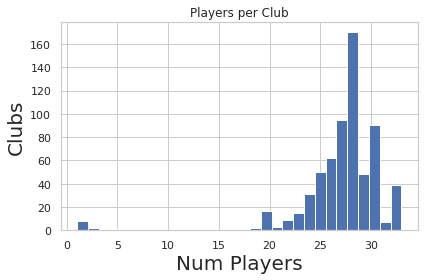

count    652.000000
mean      26.912577
std        4.455621
min        1.000000
25%       26.000000
50%       28.000000
75%       29.000000
max       33.000000
Name: club, dtype: float64

In [78]:
club_player_count = df_raw['club'].value_counts()
    
plt.figure(figsize=[6,4])

plt.hist(club_player_count, bins=30, label='club')

plt.xlabel('Num Players', fontsize=20)
plt.ylabel('Clubs', fontsize = 20)
plt.title('Players per Club')

plt.tight_layout()
plt.show()

club_player_count.describe()

Let's see how the test club player count compare.

In [79]:
for club in TEST_SET_CLUBS:
    cnt = df_raw[ df_raw['club'].isin([club])].shape[0]
    print(f"{club} - {cnt}")

FC Barcelona - 27
FC Bayern München - 28
Real Madrid - 32
Paris Saint-Germain - 29
Juventus - 24
Atlético Madrid - 33
Manchester City - 33
Liverpool - 31
Manchester United - 33


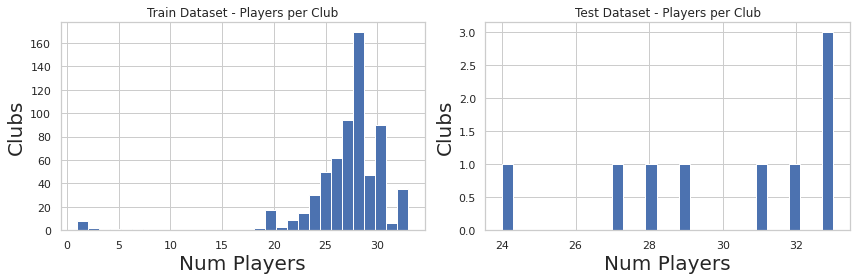

In [80]:
fig, axs = plt.subplots( nrows=1, ncols=2, figsize=(12,4))
ax = axs.ravel()

ax[0].hist( train_dataset['club'].value_counts(), bins=30)
ax[0].set_xlabel('Num Players', fontsize=20)
ax[0].set_ylabel('Clubs', fontsize = 20)
ax[0].set_title('Train Dataset - Players per Club')

ax[1].hist( test_dataset['club'].value_counts(), bins=30)
ax[1].set_xlabel('Num Players', fontsize=20)
ax[1].set_ylabel('Clubs', fontsize = 20)
ax[1].set_title('Test Dataset - Players per Club')

plt.tight_layout()
plt.show()

In [81]:
team_position_counts['train_count'] = train_dataset[['team_position']].value_counts().to_frame('count')
team_position_counts['train_pct'] = team_position_counts['train_count'] / len(df_raw) * 100

team_position_counts['test_count'] = test_dataset[['team_position']].value_counts().to_frame('count')
team_position_counts['test_pct'] = team_position_counts['train_count'] / len(df_raw) * 100

#team_position_counts.reset_index()
team_position_counts

,all_count,all_pct,train_count,train_pct,test_count,test_pct
team_position,,,,,,
SUB,7593,43.272354,NaN,NaN,NaN,NaN
RES,2928,16.686613,NaN,NaN,NaN,NaN
GK,642,3.658745,NaN,NaN,NaN,NaN
LCB,638,3.635949,NaN,NaN,NaN,NaN
RCB,638,3.635949,NaN,NaN,NaN,NaN
LB,558,3.180031,NaN,NaN,NaN,NaN
RB,555,3.162934,NaN,NaN,NaN,NaN
ST,445,2.536046,NaN,NaN,NaN,NaN
LM,435,2.479056,NaN,NaN,NaN,NaN
